<a href="https://colab.research.google.com/github/WalterPiTheScienceGuy/PiperPiTry/blob/master/Copy_of_MovingAverageModeling_for_June20.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
%matplotlib inline
 
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import font_manager as fm, rcParams
import matplotlib.ticker as mtick
from cycler import cycler
from glob import glob
#import tensorflow as tf
import pandas as pd

Doric_basepath = '/content/drive/My Drive/Doric_Data/resampled_Aug4/'
Dec14_list = glob(os.path.join(Doric_basepath, 'resampled*Dec14*'))
Dec15_list = glob(os.path.join(Doric_basepath, 'resampled*Dec15*'))
mar7_list  = glob(os.path.join(Doric_basepath, 'resampled*mar7*'))
mar8_list  = glob(os.path.join(Doric_basepath, 'resampled*mar8*'))
June14_list  = glob(os.path.join(Doric_basepath, 'resampled*June14*'))
June20_list  = glob(os.path.join(Doric_basepath, 'resampled*June20*')) # Discriminative PTC (CS+US and CS- alternated) (CS+ or CS- being 2kHz or 10kHz was pseudorandom, as was CS+ first versus CS- first. These were pseudorandomized 2-dimensional counterbalanced design (Show in table for both DiscPTC and DiscLTM))
June21_list  = glob(os.path.join(Doric_basepath, 'resampled*June21*')) # Discriminative LTM (CS+ and CS- alternated 3x each, then novel tones (pitches: high (14kHz), low (1kHz)))
 
Doric_dict={'Dec14':Dec14_list,
                  'Dec15':Dec15_list,
                  'mar7':mar7_list,
                  'mar8':mar8_list,
                  'June14':June14_list,
                  'June20':June20_list,
                  'June21':June21_list
                  }
session_dict = {'Dec14':['285295','285296','285298','285299','285300',
                          '285301','285302','285303','285305','285306'],
                  'Dec15':['285295','285296','285298','285301','285302','285303'],
                  'mar7':['285299','285300','285305','285306'],
                  'mar8':['285295','285296','285298','285299','285300','285303',
                          '285305','285306'],
                  'June14':['285295','285298','285300','285305','285306'],
                  'June20':['285295','285298','285300','285305','285306'],
                  'June21':['285295','285298','285300','285305','285306']
                  }



In [ ]:
ALL_DATA = dict()
for day in ['June20']:  #day in session_dict.keys():
    if day == 'Dec14': 
      Doric_basepath = '/content/drive/My Drive/Doric_Data/December14/'
    else:
        Doric_basepath = '/content/drive/My Drive/Doric_Data/resampled_Aug4/'
    for ID in session_dict[day]:
        unit_ID = day+'_'+ID
        print(glob(os.path.join(Doric_basepath, '*'+ID+'_'+day+'*')))
        doric_data = pd.read_csv(glob(os.path.join(Doric_basepath, '*'+ID+'_'+day+'*'))[0])
        display(doric_data.head())
        if day == 'Dec14': 
          doric_data = doric_data.iloc[:,:6]
          doric_data.columns = ['t','Green_doric_demod', 'G_Raw','Red_doric_demod','R_Raw','Events']
          doric_data['FILE_ID'] = unit_ID 
        print('Doricfile Loaded for '+unit_ID)
        ALL_DATA[unit_ID] = doric_data
        print(unit_ID)

['/content/drive/My Drive/Doric_Data/resampled_Aug4/resampled5ms_DiscPTC_walter_285295_June20_2020.csv']


,deltatimeindex,t,Events,Green_doric_demod,Red_doric_demod,G_analytic,G_amp,R_analytic,R_amp,FILE_ID
0,00:00:00.362155,0.364673,0.0,0.029903,0.090868,0.001427,0.001427,0.063624,0.063624,285295_June20
1,00:00:00.367155,0.369594,0.0,0.029916,0.090879,0.001073,0.001073,0.063480,0.063480,285295_June20
2,00:00:00.372155,0.374681,0.0,0.029925,0.090899,0.000892,0.000892,0.062880,0.062880,285295_June20
3,00:00:00.377155,0.379766,0.0,0.029929,0.090926,0.001160,0.001160,0.063091,0.063091,285295_June20
4,00:00:00.382155,0.384688,0.0,0.029926,0.090954,0.001170,0.001170,0.063147,0.063147,285295_June20


Doricfile Loaded for June20_285295
June20_285295
['/content/drive/My Drive/Doric_Data/resampled_Aug4/resampled5ms_DiscPTC_walter_285298_June20_2020.csv']


,deltatimeindex,t,Events,Green_doric_demod,Red_doric_demod,G_analytic,G_amp,R_analytic,R_amp,FILE_ID
0,00:00:00.362154,0.364671,0.0,0.019200,0.069226,0.008106,0.008106,0.041574,0.041574,285298_June20
1,00:00:00.367154,0.369593,0.0,0.019194,0.069226,0.008757,0.008757,0.042168,0.042168,285298_June20
2,00:00:00.372154,0.374679,0.0,0.019192,0.069218,0.008392,0.008392,0.042150,0.042150,285298_June20
3,00:00:00.377154,0.379765,0.0,0.019194,0.069205,0.008372,0.008372,0.042128,0.042128,285298_June20
4,00:00:00.382154,0.384687,0.0,0.019199,0.069188,0.008028,0.008028,0.041529,0.041529,285298_June20


Doricfile Loaded for June20_285298
June20_285298
['/content/drive/My Drive/Doric_Data/resampled_Aug4/resampled5ms_DiscPTC_walter_285300_June20_2020.csv']


,deltatimeindex,t,Events,Green_doric_demod,Red_doric_demod,G_analytic,G_amp,R_analytic,R_amp,FILE_ID
0,00:00:00.362155,0.364673,0.0,0.021257,0.396182,0.012843,0.012843,0.201984,0.201984,285300_June20
1,00:00:00.367155,0.369594,0.0,0.021264,0.396033,0.013168,0.013168,0.201599,0.201599,285300_June20
2,00:00:00.372155,0.374680,0.0,0.021268,0.395914,0.013108,0.013108,0.201434,0.201434,285300_June20
3,00:00:00.377155,0.379766,0.0,0.021267,0.395834,0.013082,0.013082,0.201424,0.201424,285300_June20
4,00:00:00.382155,0.384688,0.0,0.021263,0.395791,0.013275,0.013275,0.202071,0.202071,285300_June20


Doricfile Loaded for June20_285300
June20_285300
['/content/drive/My Drive/Doric_Data/resampled_Aug4/resampled5ms_DiscPTC_walter_285305_June20_2020.csv']


,deltatimeindex,t,Events,Green_doric_demod,Red_doric_demod,G_analytic,G_amp,R_analytic,R_amp,FILE_ID
0,00:00:00.362155,0.364673,0.0,0.015302,0.028396,0.007547,0.007547,0.012715,0.012715,285305_June20
1,00:00:00.367155,0.369595,0.0,0.015315,0.028408,0.008101,0.008101,0.012883,0.012883,285305_June20
2,00:00:00.372155,0.374681,0.0,0.015332,0.028424,0.008079,0.008079,0.012641,0.012641,285305_June20
3,00:00:00.377155,0.379767,0.0,0.015349,0.028436,0.008330,0.008330,0.012768,0.012768,285305_June20
4,00:00:00.382155,0.384689,0.0,0.015359,0.028440,0.008257,0.008257,0.012471,0.012471,285305_June20


Doricfile Loaded for June20_285305
June20_285305
['/content/drive/My Drive/Doric_Data/resampled_Aug4/resampled5ms_DiscPTC_walter_285306_June20_2020.csv']


,deltatimeindex,t,Events,Green_doric_demod,Red_doric_demod,G_analytic,G_amp,R_analytic,R_amp,FILE_ID
0,00:00:00.362155,0.364673,0.0,0.021703,0.148995,0.006352,0.006352,0.018414,0.018414,285306_June20
1,00:00:00.367155,0.369595,0.0,0.021688,0.148995,0.006845,0.006845,0.017982,0.017982,285306_June20
2,00:00:00.372155,0.374680,0.0,0.021671,0.149004,0.006650,0.006650,0.017842,0.017842,285306_June20
3,00:00:00.377155,0.379766,0.0,0.021655,0.149022,0.006616,0.006616,0.018076,0.018076,285306_June20
4,00:00:00.382155,0.384688,0.0,0.021641,0.149044,0.006803,0.006803,0.018341,0.018341,285306_June20


Doricfile Loaded for June20_285306
June20_285306


June20_285295


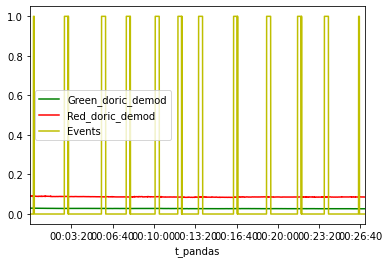

t0_idx: 11449
t[t0_idx]: 1145.3121493291662
-9791
-9601
-7993
-6794
-6604
-5395


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


(300,)
(3, 300)
(300,)
(3, 300)


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


(300,)
(3, 300)
(300,)
(3, 300)


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


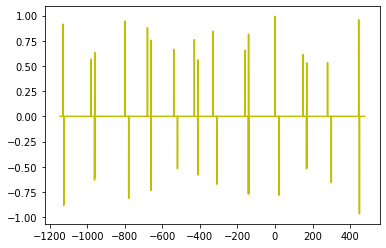

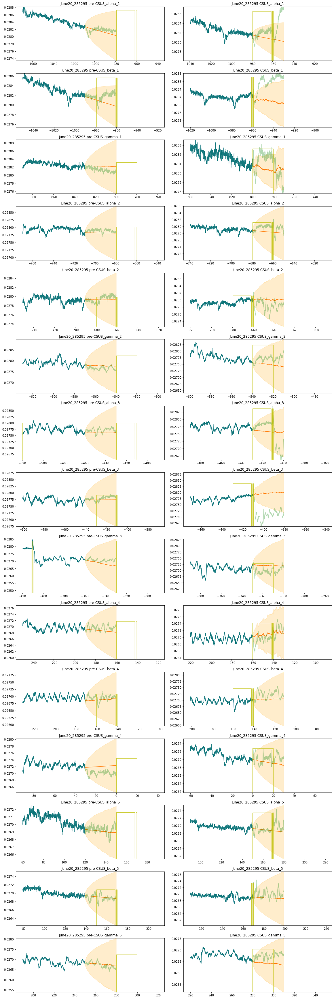

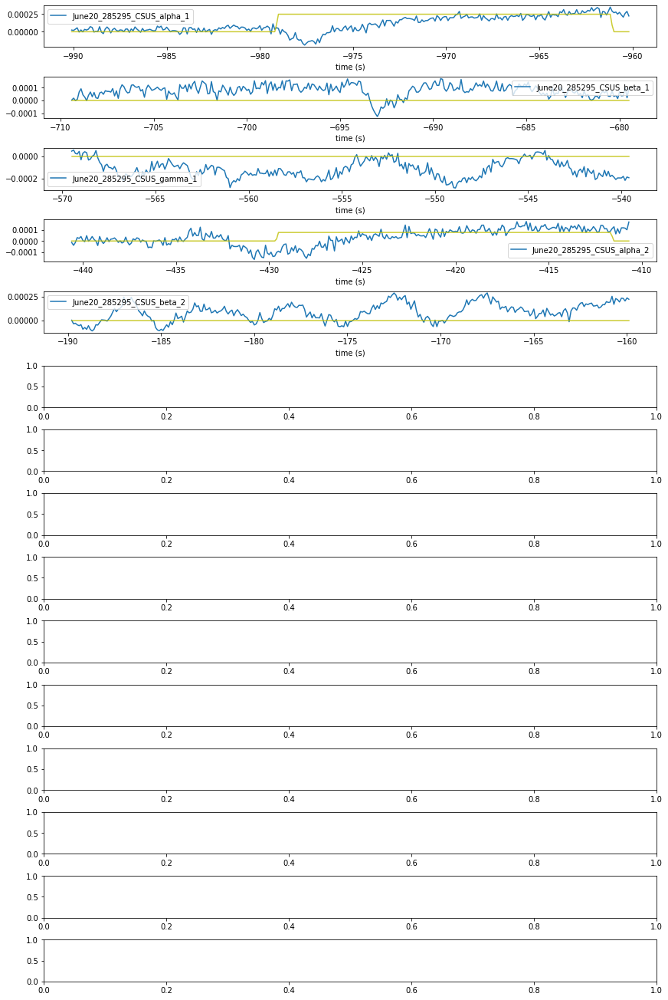

,pre-CSUS_alpha_1,CSUS_alpha_1,pre-CSUS_beta_1,CSUS_beta_1,pre-CSUS_gamma_1,CSUS_gamma_1,pre-CSUS_alpha_2,CSUS_alpha_2,pre-CSUS_beta_2,CSUS_beta_2,pre-CSUS_gamma_2,CSUS_gamma_2,pre-CSUS_alpha_3,CSUS_alpha_3,pre-CSUS_beta_3,CSUS_beta_3,pre-CSUS_gamma_3,CSUS_gamma_3,pre-CSUS_alpha_4,CSUS_alpha_4,pre-CSUS_beta_4,CSUS_beta_4,pre-CSUS_gamma_4,CSUS_gamma_4,pre-CSUS_alpha_5,CSUS_alpha_5,pre-CSUS_beta_5,CSUS_beta_5,pre-CSUS_gamma_5,CSUS_gamma_5
June20_285295_AIC,-10537.334160,-10607.259616,-10591.882490,-10558.794714,-10594.262779,-10652.128255,-10462.197021,-10523.028172,-10517.038360,-10541.151861,-10241.539262,-10336.507992,-10366.787161,-10487.287486,-10415.572625,-10499.509428,-10075.901612,-10360.663030,-10503.174201,-10499.615572,-10479.914917,-10376.491612,-10526.426085,-10582.211160,-10708.259449,-10588.014099,-10672.688464,-10501.844485,-10260.216971,-10280.854893
June20_285295_RMSE,0.000094,0.000299,0.000156,0.000520,0.000093,0.000144,0.000090,0.000157,0.000073,0.000214,0.000138,0.000251,0.000139,0.000420,0.000083,0.000877,0.000248,0.000257,0.000129,0.000184,0.000124,0.000242,0.000206,0.000154,0.000055,0.000143,0.000072,0.000179,0.000124,0.000353
June20_285295RMSE_normed_fitmean,0.003307,0.010590,0.005511,0.018445,0.003281,0.005095,0.003237,0.005618,0.002632,0.007658,0.004937,0.009023,0.004996,0.015131,0.002990,0.031603,0.009096,0.009497,0.004774,0.006827,0.004610,0.008986,0.007568,0.005689,0.002025,0.005318,0.002662,0.006660,0.004599,0.013207
June20_285295RMSE_Mean_Error,0.000030,0.000190,0.000106,0.000471,-0.000073,0.000054,0.000076,0.000119,0.000019,-0.000158,-0.000115,0.000215,0.000108,-0.000011,0.000034,-0.000826,0.000203,-0.000223,0.000090,-0.000050,0.000065,0.000190,-0.000195,0.000099,0.000024,0.000057,-0.000009,0.000130,-0.000044,0.000332
June20_285295RMSE_normed_fitmean_Mean_Error,0.001068,0.006733,0.003748,0.016686,-0.002570,0.001904,0.002730,0.004267,0.000688,-0.005671,-0.004112,0.007724,0.003901,-0.000397,0.001231,-0.029770,0.007475,-0.008219,0.003321,-0.001850,0.002417,0.007060,-0.007159,0.003664,0.000893,0.002100,-0.000333,0.004813,-0.001619,0.012395


June20_285298


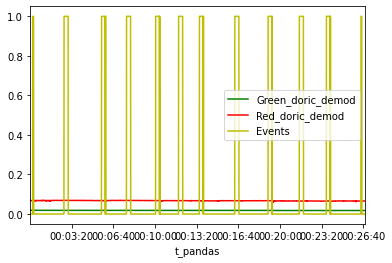

t0_idx: 9818
t[t0_idx]: 982.2171561991667
-8192
-6394
-6204
-5195
-3796
-3606
(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


(300,)
(3, 300)


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


(300,)
(3, 300)
(300,)
(3, 300)


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


(300,)
(3, 300)
(300,)
(3, 300)


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


(300,)
(3, 300)
(300,)
(3, 300)


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


(300,)
(3, 300)


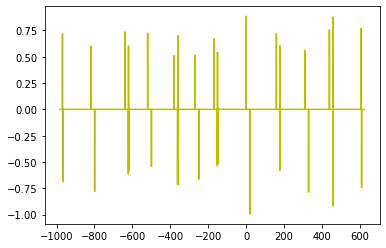

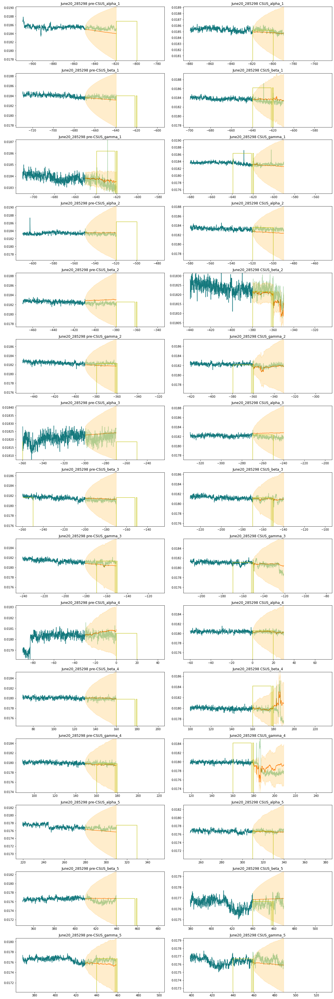

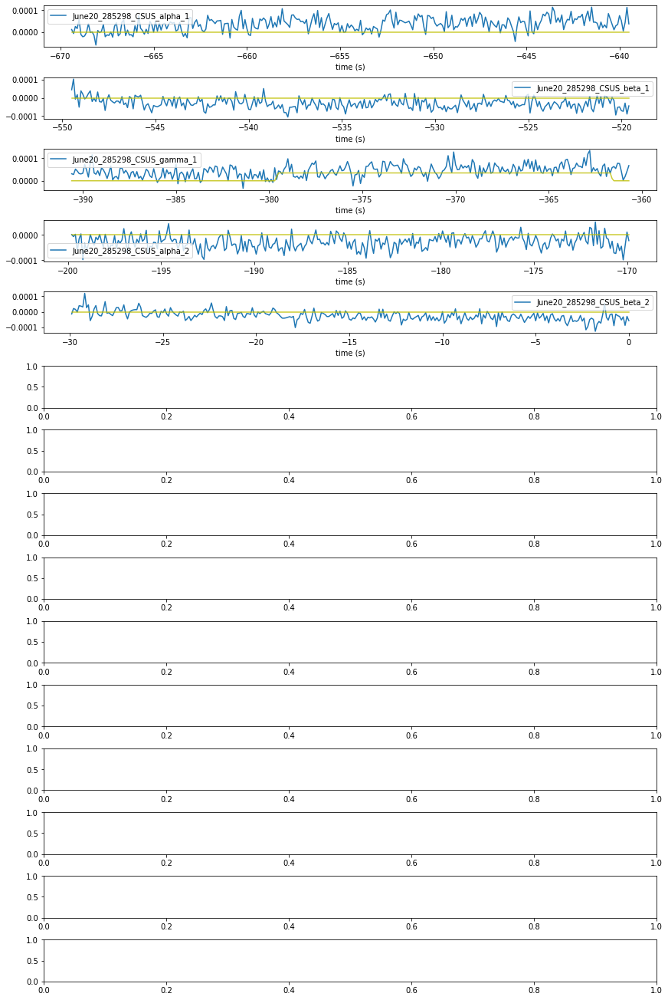

,pre-CSUS_alpha_1,CSUS_alpha_1,pre-CSUS_beta_1,CSUS_beta_1,pre-CSUS_gamma_1,CSUS_gamma_1,pre-CSUS_alpha_2,CSUS_alpha_2,pre-CSUS_beta_2,CSUS_beta_2,pre-CSUS_gamma_2,CSUS_gamma_2,pre-CSUS_alpha_3,CSUS_alpha_3,pre-CSUS_beta_3,CSUS_beta_3,pre-CSUS_gamma_3,CSUS_gamma_3,pre-CSUS_alpha_4,CSUS_alpha_4,pre-CSUS_beta_4,CSUS_beta_4,pre-CSUS_gamma_4,CSUS_gamma_4,pre-CSUS_alpha_5,CSUS_alpha_5,pre-CSUS_beta_5,CSUS_beta_5,pre-CSUS_gamma_5,CSUS_gamma_5
June20_285298_AIC,-10665.643472,-10841.813363,-10805.522448,-10750.742383,-10902.655690,-10497.130873,-10568.312319,-10746.661845,-10760.778230,-10925.229880,-10772.461978,-10848.355814,-10834.897520,-10787.018913,-10796.511602,-10772.324319,-10786.982226,-10795.942736,-10858.607397,-1.080754e+04,-10851.257735,-10821.511701,-10814.068403,-10781.456839,-10635.664796,-10650.895363,-10720.772903,-10729.522669,-10700.036844,-10763.687588
June20_285298_RMSE,0.000083,0.000043,0.000047,0.000063,0.000047,0.000056,0.000041,0.000074,0.000075,0.000045,0.000052,0.000044,0.000037,0.000091,0.000039,0.000039,0.000054,0.000068,0.000040,2.807150e-05,0.000031,0.000123,0.000036,0.000218,0.000074,0.000037,0.000072,0.000052,0.000077,0.000062
June20_285298RMSE_normed_fitmean,0.004457,0.002331,0.002578,0.003434,0.002529,0.003076,0.002245,0.004015,0.004125,0.002448,0.002837,0.002410,0.002026,0.005011,0.002128,0.002163,0.002991,0.003757,0.002195,1.556134e-03,0.001728,0.006838,0.002012,0.012147,0.004184,0.002116,0.004066,0.002967,0.004366,0.003538
June20_285298RMSE_Mean_Error,0.000073,0.000031,0.000036,-0.000039,-0.000022,0.000033,-0.000029,0.000067,-0.000070,0.000030,0.000044,0.000027,-0.000024,-0.000084,-0.000028,-0.000002,0.000045,-0.000030,-0.000025,5.049719e-07,-0.000015,-0.000041,0.000023,-0.000037,0.000064,0.000016,-0.000052,-0.000036,0.000064,0.000050
June20_285298RMSE_normed_fitmean_Mean_Error,0.003923,0.001648,0.001954,-0.002118,-0.001197,0.001819,-0.001575,0.003655,-0.003853,0.001670,0.002428,0.001482,-0.001342,-0.004607,-0.001532,-0.000086,0.002457,-0.001650,-0.001370,2.799295e-05,-0.000810,-0.002270,0.001257,-0.002040,0.003592,0.000888,-0.002927,-0.002043,0.003628,0.002825


June20_285300


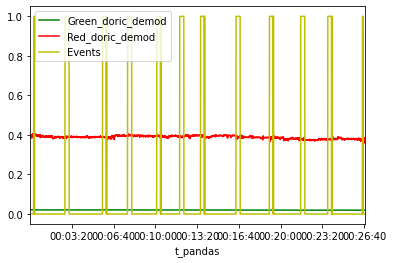

t0_idx: 14447
t[t0_idx]: 1445.112152685417
-12778
-10980
-10790
-9781
-8382
-8192
(300,)
(3, 300)


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


(300,)
(3, 300)
(300,)
(3, 300)


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


(300,)
(3, 300)
(300,)
(3, 300)


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)


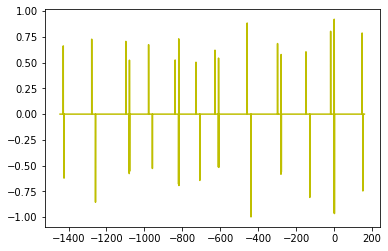

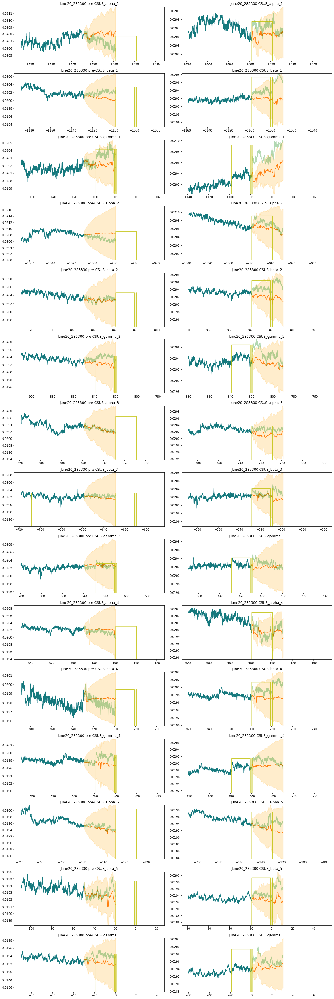

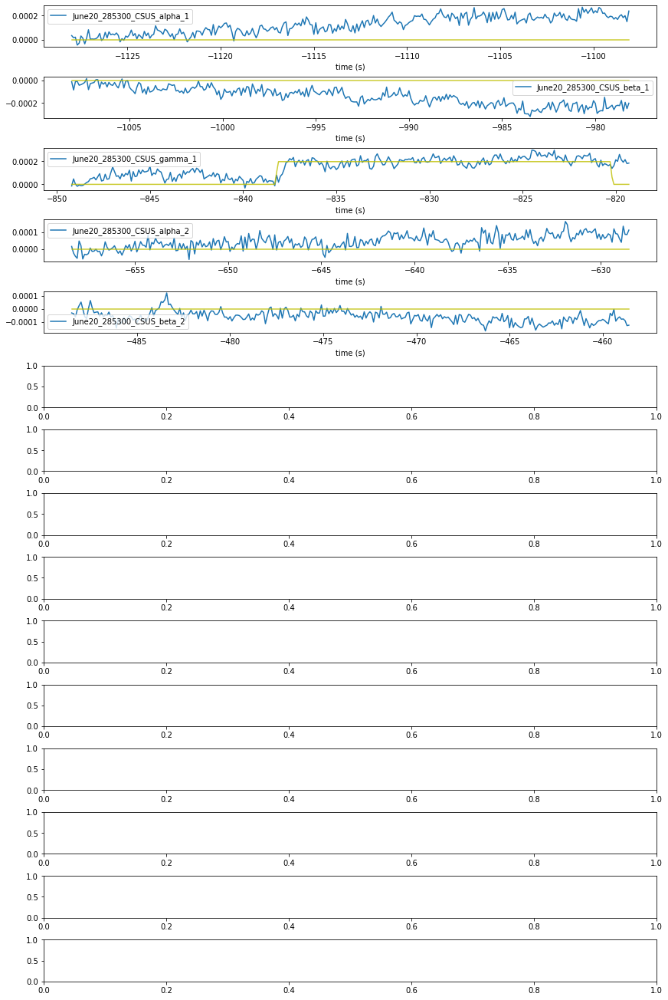

,pre-CSUS_alpha_1,CSUS_alpha_1,pre-CSUS_beta_1,CSUS_beta_1,pre-CSUS_gamma_1,CSUS_gamma_1,pre-CSUS_alpha_2,CSUS_alpha_2,pre-CSUS_beta_2,CSUS_beta_2,pre-CSUS_gamma_2,CSUS_gamma_2,pre-CSUS_alpha_3,CSUS_alpha_3,pre-CSUS_beta_3,CSUS_beta_3,pre-CSUS_gamma_3,CSUS_gamma_3,pre-CSUS_alpha_4,CSUS_alpha_4,pre-CSUS_beta_4,CSUS_beta_4,pre-CSUS_gamma_4,CSUS_gamma_4,pre-CSUS_alpha_5,CSUS_alpha_5,pre-CSUS_beta_5,CSUS_beta_5,pre-CSUS_gamma_5,CSUS_gamma_5
June20_285300_AIC,-10669.858375,-10721.641138,-10629.486754,-10614.330428,-10664.294920,-10624.812077,-10490.033209,-10624.183791,-10559.540446,-10637.433123,-10607.266525,-10701.516419,-10531.589517,-10597.654594,-10577.423699,-10612.473828,-10589.982728,-10633.481372,-10594.329423,-10665.994438,-10623.216423,-10590.341576,-10589.594764,-10547.305825,-10519.614819,-10590.669694,-10687.991845,-10635.040328,-10612.391112,-10606.025362
June20_285300_RMSE,0.000128,0.000109,0.000143,0.000354,0.000129,0.000341,0.000161,0.000109,0.000050,0.000299,0.000169,0.000183,0.000036,0.000169,0.000061,0.000136,0.000051,0.000124,0.000073,0.000082,0.000077,0.000278,0.000163,0.000168,0.000071,0.000203,0.000084,0.000288,0.000172,0.000213
June20_285300RMSE_normed_fitmean,0.006200,0.005272,0.007056,0.017531,0.006424,0.016854,0.007704,0.005250,0.002435,0.014705,0.008294,0.008975,0.001780,0.008327,0.003037,0.006739,0.002540,0.006107,0.003584,0.004046,0.003892,0.014075,0.008225,0.008476,0.003620,0.010393,0.004358,0.014905,0.008919,0.011001
June20_285300RMSE_Mean_Error,-0.000102,0.000089,0.000123,0.000300,0.000095,0.000326,-0.000141,0.000093,0.000017,0.000275,0.000150,0.000165,-0.000002,0.000159,0.000046,0.000087,-0.000021,0.000081,-0.000058,0.000019,-0.000046,0.000252,0.000125,0.000141,0.000055,0.000154,0.000043,0.000243,0.000152,0.000186
June20_285300RMSE_normed_fitmean_Mean_Error,-0.004937,0.004314,0.006093,0.014886,0.004715,0.016118,-0.006767,0.004497,0.000811,0.013509,0.007359,0.008133,-0.000111,0.007842,0.002265,0.004282,-0.001026,0.004008,-0.002879,0.000920,-0.002323,0.012753,0.006312,0.007103,0.002803,0.007845,0.002197,0.012594,0.007854,0.009602


June20_285305


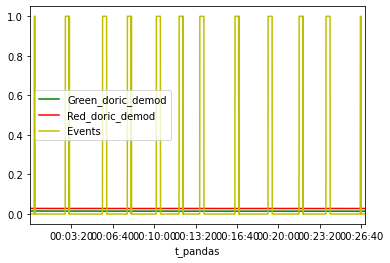

t0_idx: 7383
t[t0_idx]: 738.7121519189582
-5685
-5495
-3886
-2687
-2497
-1288


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


(300,)
(3, 300)
(300,)
(3, 300)


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


(300,)
(3, 300)
(300,)
(3, 300)


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


(300,)
(3, 300)


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)


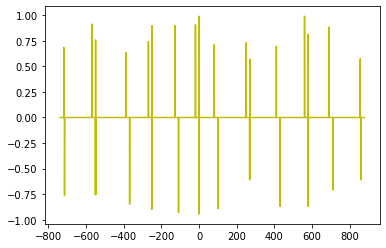

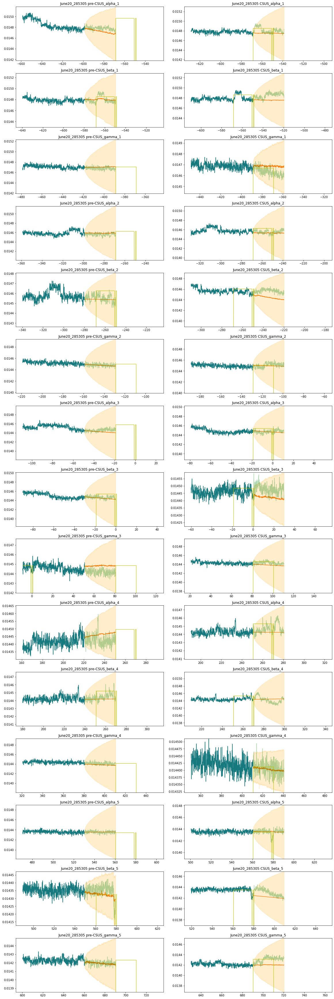

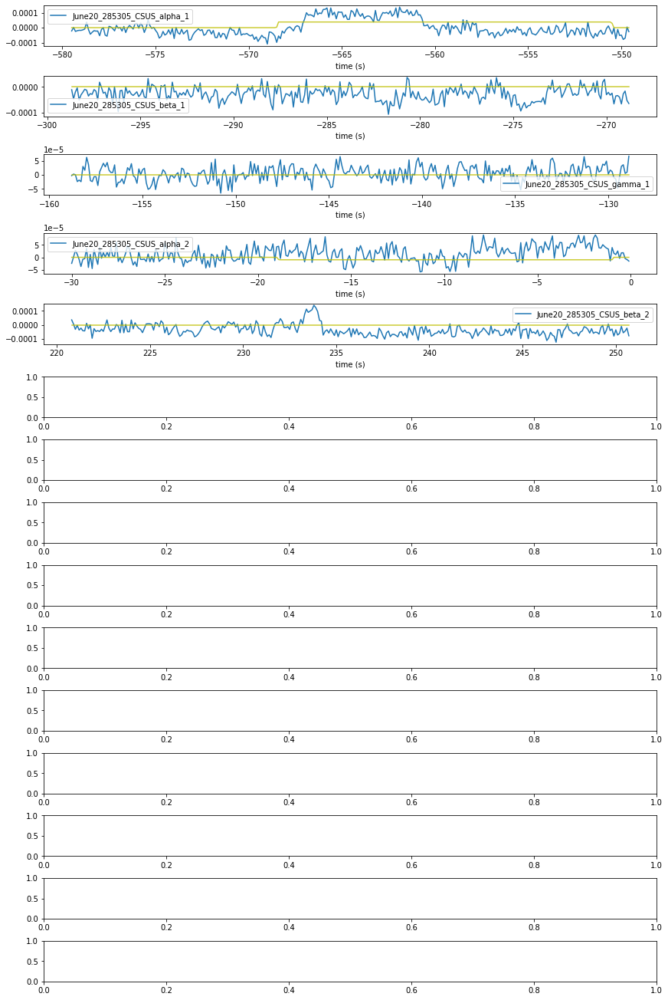

,pre-CSUS_alpha_1,CSUS_alpha_1,pre-CSUS_beta_1,CSUS_beta_1,pre-CSUS_gamma_1,CSUS_gamma_1,pre-CSUS_alpha_2,CSUS_alpha_2,pre-CSUS_beta_2,CSUS_beta_2,pre-CSUS_gamma_2,CSUS_gamma_2,pre-CSUS_alpha_3,CSUS_alpha_3,pre-CSUS_beta_3,CSUS_beta_3,pre-CSUS_gamma_3,CSUS_gamma_3,pre-CSUS_alpha_4,CSUS_alpha_4,pre-CSUS_beta_4,CSUS_beta_4,pre-CSUS_gamma_4,CSUS_gamma_4,pre-CSUS_alpha_5,CSUS_alpha_5,pre-CSUS_beta_5,CSUS_beta_5,pre-CSUS_gamma_5,CSUS_gamma_5
June20_285305_AIC,-10754.754008,-10811.538323,-1.079127e+04,-10815.400735,-10810.190879,-10896.491788,-10773.934828,-10779.714749,-10834.813186,-10820.075492,-10880.581736,-10838.303531,-10764.215440,-10785.006221,-10787.293640,-10860.001460,-10770.137904,-10757.676299,-10836.902840,-10726.304638,-10730.077908,-10643.944757,-10782.598123,-10953.938944,-1.078729e+04,-10845.417452,-10923.909830,-10809.931695,-10819.527886,-10773.130148
June20_285305_RMSE,0.000065,0.000084,5.457571e-05,0.000107,0.000037,0.000063,0.000039,0.000044,0.000038,0.000128,0.000027,0.000042,0.000049,0.000041,0.000035,0.000066,0.000071,0.000056,0.000054,0.000075,0.000051,0.000091,0.000038,0.000024,2.501125e-05,0.000049,0.000044,0.000096,0.000026,0.000115
June20_285305RMSE_normed_fitmean,0.004409,0.005709,3.690528e-03,0.007207,0.002491,0.004278,0.002671,0.003012,0.002579,0.008777,0.001844,0.002875,0.003401,0.002846,0.002382,0.004595,0.004880,0.003866,0.003717,0.005231,0.003547,0.006281,0.002598,0.001681,1.742163e-03,0.003404,0.003093,0.006669,0.001852,0.008102
June20_285305RMSE_Mean_Error,0.000055,0.000059,8.206847e-07,0.000092,-0.000023,-0.000052,-0.000028,0.000024,0.000012,0.000121,0.000004,0.000012,0.000033,0.000006,0.000015,0.000058,-0.000065,0.000046,-0.000035,0.000047,0.000026,-0.000023,0.000029,0.000002,-2.720639e-07,-0.000002,0.000024,0.000082,0.000003,0.000104
June20_285305RMSE_normed_fitmean_Mean_Error,0.003731,0.003978,5.549648e-05,0.006237,-0.001587,-0.003528,-0.001926,0.001622,0.000839,0.008280,0.000287,0.000823,0.002238,0.000396,0.001003,0.004015,-0.004473,0.003220,-0.002454,0.003292,0.001803,-0.001570,0.001980,0.000147,-1.895066e-05,-0.000168,0.001684,0.005733,0.000239,0.007309


June20_285306


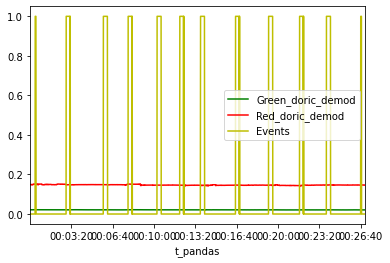

t0_idx: 15989
t[t0_idx]: 1599.3146421995611
-14247
-14057
-12449
-11250
-11060
-9851
(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)
(300,)
(3, 300)


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


(300,)
(3, 300)
(300,)
(3, 300)


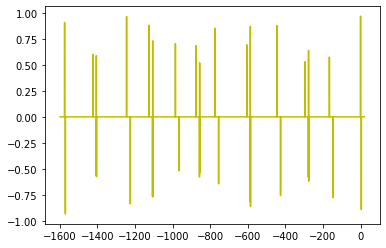

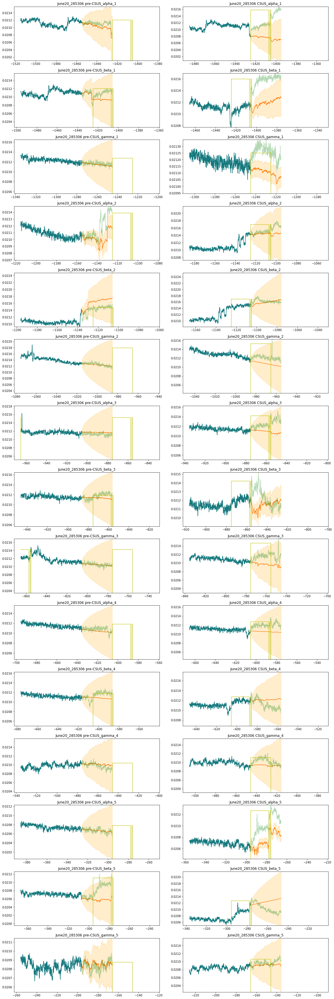

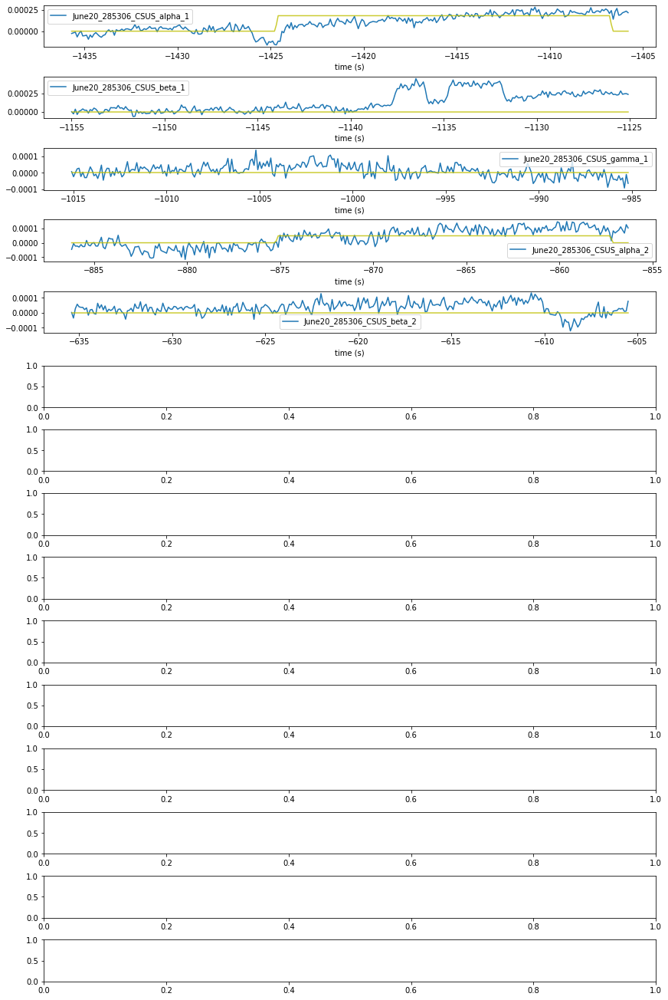

,pre-CSUS_alpha_1,CSUS_alpha_1,pre-CSUS_beta_1,CSUS_beta_1,pre-CSUS_gamma_1,CSUS_gamma_1,pre-CSUS_alpha_2,CSUS_alpha_2,pre-CSUS_beta_2,CSUS_beta_2,pre-CSUS_gamma_2,CSUS_gamma_2,pre-CSUS_alpha_3,CSUS_alpha_3,pre-CSUS_beta_3,CSUS_beta_3,pre-CSUS_gamma_3,CSUS_gamma_3,pre-CSUS_alpha_4,CSUS_alpha_4,pre-CSUS_beta_4,CSUS_beta_4,pre-CSUS_gamma_4,CSUS_gamma_4,pre-CSUS_alpha_5,CSUS_alpha_5,pre-CSUS_beta_5,CSUS_beta_5,pre-CSUS_gamma_5,CSUS_gamma_5
June20_285306_AIC,-10704.337177,-10704.438727,-10658.197271,-10719.346993,-10723.190938,-10837.109178,-10760.667050,-10522.435409,-10595.153548,-10519.183878,-10486.644557,-10695.911389,-10501.083294,-10726.090097,-10739.167910,-10830.564717,-10629.837145,-10700.380166,-10779.726924,-10739.443285,-10755.978845,-10744.177201,-10630.012345,-10691.947597,-1.070711e+04,-10769.550756,-10666.294565,-10499.737569,-10701.591320,-10656.816861
June20_285306_RMSE,0.000092,0.000552,0.000140,0.000393,0.000035,0.000156,0.000190,0.000143,0.000212,0.000091,0.000039,0.000139,0.000052,0.000199,0.000073,0.000162,0.000033,0.000214,0.000053,0.000160,0.000100,0.000136,0.000060,0.000112,3.684919e-05,0.000287,0.000281,0.000282,0.000050,0.000076
June20_285306RMSE_normed_fitmean,0.004333,0.026172,0.006618,0.018622,0.001644,0.007369,0.008992,0.006757,0.010071,0.004287,0.001804,0.006551,0.002475,0.009428,0.003432,0.007673,0.001579,0.010141,0.002502,0.007565,0.004726,0.006421,0.002867,0.005321,1.776383e-03,0.013892,0.013547,0.013585,0.002398,0.003663
June20_285306RMSE_Mean_Error,0.000074,0.000490,0.000097,0.000389,0.000017,0.000151,0.000133,0.000102,-0.000202,0.000041,0.000012,0.000132,-0.000044,0.000168,0.000036,0.000087,0.000002,0.000189,0.000034,0.000150,0.000053,-0.000090,-0.000034,0.000090,-6.139928e-07,0.000274,0.000226,-0.000196,-0.000023,0.000055
June20_285306RMSE_normed_fitmean_Mean_Error,0.003493,0.023204,0.004593,0.018409,0.000780,0.007146,0.006308,0.004854,-0.009613,0.001915,0.000559,0.006213,-0.002073,0.007950,0.001689,0.004104,0.000113,0.008966,0.001605,0.007101,0.002499,-0.004265,-0.001642,0.004296,-2.959865e-05,0.013252,0.010927,-0.009424,-0.001115,0.002617


(5, 5, 30)
False
AIC


,pre-CSUS_alpha_1,CSUS_alpha_1,pre-CSUS_beta_1,CSUS_beta_1,pre-CSUS_gamma_1,CSUS_gamma_1,pre-CSUS_alpha_2,CSUS_alpha_2,pre-CSUS_beta_2,CSUS_beta_2,pre-CSUS_gamma_2,CSUS_gamma_2,pre-CSUS_alpha_3,CSUS_alpha_3,pre-CSUS_beta_3,CSUS_beta_3,pre-CSUS_gamma_3,CSUS_gamma_3,pre-CSUS_alpha_4,CSUS_alpha_4,pre-CSUS_beta_4,CSUS_beta_4,pre-CSUS_gamma_4,CSUS_gamma_4,pre-CSUS_alpha_5,CSUS_alpha_5,pre-CSUS_beta_5,CSUS_beta_5,pre-CSUS_gamma_5,CSUS_gamma_5
June20_285295,-10537.334160,-10607.259616,-10591.882490,-10558.794714,-10594.262779,-10652.128255,-10462.197021,-10523.028172,-10517.038360,-10541.151861,-10241.539262,-10336.507992,-10366.787161,-10487.287486,-10415.572625,-10499.509428,-10075.901612,-10360.663030,-10503.174201,-10499.615572,-10479.914917,-10376.491612,-10526.426085,-10582.211160,-10708.259449,-10588.014099,-10672.688464,-10501.844485,-10260.216971,-10280.854893
June20_285298,-10665.643472,-10841.813363,-10805.522448,-10750.742383,-10902.655690,-10497.130873,-10568.312319,-10746.661845,-10760.778230,-10925.229880,-10772.461978,-10848.355814,-10834.897520,-10787.018913,-10796.511602,-10772.324319,-10786.982226,-10795.942736,-10858.607397,-10807.542768,-10851.257735,-10821.511701,-10814.068403,-10781.456839,-10635.664796,-10650.895363,-10720.772903,-10729.522669,-10700.036844,-10763.687588
June20_285300,-10669.858375,-10721.641138,-10629.486754,-10614.330428,-10664.294920,-10624.812077,-10490.033209,-10624.183791,-10559.540446,-10637.433123,-10607.266525,-10701.516419,-10531.589517,-10597.654594,-10577.423699,-10612.473828,-10589.982728,-10633.481372,-10594.329423,-10665.994438,-10623.216423,-10590.341576,-10589.594764,-10547.305825,-10519.614819,-10590.669694,-10687.991845,-10635.040328,-10612.391112,-10606.025362
June20_285305,-10754.754008,-10811.538323,-10791.268244,-10815.400735,-10810.190879,-10896.491788,-10773.934828,-10779.714749,-10834.813186,-10820.075492,-10880.581736,-10838.303531,-10764.215440,-10785.006221,-10787.293640,-10860.001460,-10770.137904,-10757.676299,-10836.902840,-10726.304638,-10730.077908,-10643.944757,-10782.598123,-10953.938944,-10787.288944,-10845.417452,-10923.909830,-10809.931695,-10819.527886,-10773.130148
June20_285306,-10704.337177,-10704.438727,-10658.197271,-10719.346993,-10723.190938,-10837.109178,-10760.667050,-10522.435409,-10595.153548,-10519.183878,-10486.644557,-10695.911389,-10501.083294,-10726.090097,-10739.167910,-10830.564717,-10629.837145,-10700.380166,-10779.726924,-10739.443285,-10755.978845,-10744.177201,-10630.012345,-10691.947597,-10707.106247,-10769.550756,-10666.294565,-10499.737569,-10701.591320,-10656.816861


RMSE


,pre-CSUS_alpha_1,CSUS_alpha_1,pre-CSUS_beta_1,CSUS_beta_1,pre-CSUS_gamma_1,CSUS_gamma_1,pre-CSUS_alpha_2,CSUS_alpha_2,pre-CSUS_beta_2,CSUS_beta_2,pre-CSUS_gamma_2,CSUS_gamma_2,pre-CSUS_alpha_3,CSUS_alpha_3,pre-CSUS_beta_3,CSUS_beta_3,pre-CSUS_gamma_3,CSUS_gamma_3,pre-CSUS_alpha_4,CSUS_alpha_4,pre-CSUS_beta_4,CSUS_beta_4,pre-CSUS_gamma_4,CSUS_gamma_4,pre-CSUS_alpha_5,CSUS_alpha_5,pre-CSUS_beta_5,CSUS_beta_5,pre-CSUS_gamma_5,CSUS_gamma_5
June20_285295,0.000094,0.000299,0.000156,0.000520,0.000093,0.000144,0.000090,0.000157,0.000073,0.000214,0.000138,0.000251,0.000139,0.000420,0.000083,0.000877,0.000248,0.000257,0.000129,0.000184,0.000124,0.000242,0.000206,0.000154,0.000055,0.000143,0.000072,0.000179,0.000124,0.000353
June20_285298,0.000083,0.000043,0.000047,0.000063,0.000047,0.000056,0.000041,0.000074,0.000075,0.000045,0.000052,0.000044,0.000037,0.000091,0.000039,0.000039,0.000054,0.000068,0.000040,0.000028,0.000031,0.000123,0.000036,0.000218,0.000074,0.000037,0.000072,0.000052,0.000077,0.000062
June20_285300,0.000128,0.000109,0.000143,0.000354,0.000129,0.000341,0.000161,0.000109,0.000050,0.000299,0.000169,0.000183,0.000036,0.000169,0.000061,0.000136,0.000051,0.000124,0.000073,0.000082,0.000077,0.000278,0.000163,0.000168,0.000071,0.000203,0.000084,0.000288,0.000172,0.000213
June20_285305,0.000065,0.000084,0.000055,0.000107,0.000037,0.000063,0.000039,0.000044,0.000038,0.000128,0.000027,0.000042,0.000049,0.000041,0.000035,0.000066,0.000071,0.000056,0.000054,0.000075,0.000051,0.000091,0.000038,0.000024,0.000025,0.000049,0.000044,0.000096,0.000026,0.000115
June20_285306,0.000092,0.000552,0.000140,0.000393,0.000035,0.000156,0.000190,0.000143,0.000212,0.000091,0.000039,0.000139,0.000052,0.000199,0.000073,0.000162,0.000033,0.000214,0.000053,0.000160,0.000100,0.000136,0.000060,0.000112,0.000037,0.000287,0.000281,0.000282,0.000050,0.000076


RMSE_normed


,pre-CSUS_alpha_1,CSUS_alpha_1,pre-CSUS_beta_1,CSUS_beta_1,pre-CSUS_gamma_1,CSUS_gamma_1,pre-CSUS_alpha_2,CSUS_alpha_2,pre-CSUS_beta_2,CSUS_beta_2,pre-CSUS_gamma_2,CSUS_gamma_2,pre-CSUS_alpha_3,CSUS_alpha_3,pre-CSUS_beta_3,CSUS_beta_3,pre-CSUS_gamma_3,CSUS_gamma_3,pre-CSUS_alpha_4,CSUS_alpha_4,pre-CSUS_beta_4,CSUS_beta_4,pre-CSUS_gamma_4,CSUS_gamma_4,pre-CSUS_alpha_5,CSUS_alpha_5,pre-CSUS_beta_5,CSUS_beta_5,pre-CSUS_gamma_5,CSUS_gamma_5
June20_285295,0.003307,0.010590,0.005511,0.018445,0.003281,0.005095,0.003237,0.005618,0.002632,0.007658,0.004937,0.009023,0.004996,0.015131,0.002990,0.031603,0.009096,0.009497,0.004774,0.006827,0.004610,0.008986,0.007568,0.005689,0.002025,0.005318,0.002662,0.006660,0.004599,0.013207
June20_285298,0.004457,0.002331,0.002578,0.003434,0.002529,0.003076,0.002245,0.004015,0.004125,0.002448,0.002837,0.002410,0.002026,0.005011,0.002128,0.002163,0.002991,0.003757,0.002195,0.001556,0.001728,0.006838,0.002012,0.012147,0.004184,0.002116,0.004066,0.002967,0.004366,0.003538
June20_285300,0.006200,0.005272,0.007056,0.017531,0.006424,0.016854,0.007704,0.005250,0.002435,0.014705,0.008294,0.008975,0.001780,0.008327,0.003037,0.006739,0.002540,0.006107,0.003584,0.004046,0.003892,0.014075,0.008225,0.008476,0.003620,0.010393,0.004358,0.014905,0.008919,0.011001
June20_285305,0.004409,0.005709,0.003691,0.007207,0.002491,0.004278,0.002671,0.003012,0.002579,0.008777,0.001844,0.002875,0.003401,0.002846,0.002382,0.004595,0.004880,0.003866,0.003717,0.005231,0.003547,0.006281,0.002598,0.001681,0.001742,0.003404,0.003093,0.006669,0.001852,0.008102
June20_285306,0.004333,0.026172,0.006618,0.018622,0.001644,0.007369,0.008992,0.006757,0.010071,0.004287,0.001804,0.006551,0.002475,0.009428,0.003432,0.007673,0.001579,0.010141,0.002502,0.007565,0.004726,0.006421,0.002867,0.005321,0.001776,0.013892,0.013547,0.013585,0.002398,0.003663


MeanOfErrors


,pre-CSUS_alpha_1,CSUS_alpha_1,pre-CSUS_beta_1,CSUS_beta_1,pre-CSUS_gamma_1,CSUS_gamma_1,pre-CSUS_alpha_2,CSUS_alpha_2,pre-CSUS_beta_2,CSUS_beta_2,pre-CSUS_gamma_2,CSUS_gamma_2,pre-CSUS_alpha_3,CSUS_alpha_3,pre-CSUS_beta_3,CSUS_beta_3,pre-CSUS_gamma_3,CSUS_gamma_3,pre-CSUS_alpha_4,CSUS_alpha_4,pre-CSUS_beta_4,CSUS_beta_4,pre-CSUS_gamma_4,CSUS_gamma_4,pre-CSUS_alpha_5,CSUS_alpha_5,pre-CSUS_beta_5,CSUS_beta_5,pre-CSUS_gamma_5,CSUS_gamma_5
June20_285295,0.000030,0.000190,1.062018e-04,0.000471,-0.000073,0.000054,0.000076,0.000119,0.000019,-0.000158,-0.000115,0.000215,0.000108,-0.000011,0.000034,-0.000826,0.000203,-0.000223,0.000090,-4.987579e-05,0.000065,0.000190,-0.000195,0.000099,2.415414e-05,0.000057,-0.000009,0.000130,-0.000044,0.000332
June20_285298,0.000073,0.000031,3.596239e-05,-0.000039,-0.000022,0.000033,-0.000029,0.000067,-0.000070,0.000030,0.000044,0.000027,-0.000024,-0.000084,-0.000028,-0.000002,0.000045,-0.000030,-0.000025,5.049719e-07,-0.000015,-0.000041,0.000023,-0.000037,6.362027e-05,0.000016,-0.000052,-0.000036,0.000064,0.000050
June20_285300,-0.000102,0.000089,1.231189e-04,0.000300,0.000095,0.000326,-0.000141,0.000093,0.000017,0.000275,0.000150,0.000165,-0.000002,0.000159,0.000046,0.000087,-0.000021,0.000081,-0.000058,1.857190e-05,-0.000046,0.000252,0.000125,0.000141,5.525023e-05,0.000154,0.000043,0.000243,0.000152,0.000186
June20_285305,0.000055,0.000059,8.206847e-07,0.000092,-0.000023,-0.000052,-0.000028,0.000024,0.000012,0.000121,0.000004,0.000012,0.000033,0.000006,0.000015,0.000058,-0.000065,0.000046,-0.000035,4.749229e-05,0.000026,-0.000023,0.000029,0.000002,-2.720639e-07,-0.000002,0.000024,0.000082,0.000003,0.000104
June20_285306,0.000074,0.000490,9.690211e-05,0.000389,0.000017,0.000151,0.000133,0.000102,-0.000202,0.000041,0.000012,0.000132,-0.000044,0.000168,0.000036,0.000087,0.000002,0.000189,0.000034,1.498494e-04,0.000053,-0.000090,-0.000034,0.000090,-6.139928e-07,0.000274,0.000226,-0.000196,-0.000023,0.000055


MeanOfErrors_normed


,pre-CSUS_alpha_1,CSUS_alpha_1,pre-CSUS_beta_1,CSUS_beta_1,pre-CSUS_gamma_1,CSUS_gamma_1,pre-CSUS_alpha_2,CSUS_alpha_2,pre-CSUS_beta_2,CSUS_beta_2,pre-CSUS_gamma_2,CSUS_gamma_2,pre-CSUS_alpha_3,CSUS_alpha_3,pre-CSUS_beta_3,CSUS_beta_3,pre-CSUS_gamma_3,CSUS_gamma_3,pre-CSUS_alpha_4,CSUS_alpha_4,pre-CSUS_beta_4,CSUS_beta_4,pre-CSUS_gamma_4,CSUS_gamma_4,pre-CSUS_alpha_5,CSUS_alpha_5,pre-CSUS_beta_5,CSUS_beta_5,pre-CSUS_gamma_5,CSUS_gamma_5
June20_285295,0.001068,0.006733,0.003748,0.016686,-0.002570,0.001904,0.002730,0.004267,0.000688,-0.005671,-0.004112,0.007724,0.003901,-0.000397,0.001231,-0.029770,0.007475,-0.008219,0.003321,-0.001850,0.002417,0.007060,-0.007159,0.003664,0.000893,0.002100,-0.000333,0.004813,-0.001619,0.012395
June20_285298,0.003923,0.001648,0.001954,-0.002118,-0.001197,0.001819,-0.001575,0.003655,-0.003853,0.001670,0.002428,0.001482,-0.001342,-0.004607,-0.001532,-0.000086,0.002457,-0.001650,-0.001370,0.000028,-0.000810,-0.002270,0.001257,-0.002040,0.003592,0.000888,-0.002927,-0.002043,0.003628,0.002825
June20_285300,-0.004937,0.004314,0.006093,0.014886,0.004715,0.016118,-0.006767,0.004497,0.000811,0.013509,0.007359,0.008133,-0.000111,0.007842,0.002265,0.004282,-0.001026,0.004008,-0.002879,0.000920,-0.002323,0.012753,0.006312,0.007103,0.002803,0.007845,0.002197,0.012594,0.007854,0.009602
June20_285305,0.003731,0.003978,0.000055,0.006237,-0.001587,-0.003528,-0.001926,0.001622,0.000839,0.008280,0.000287,0.000823,0.002238,0.000396,0.001003,0.004015,-0.004473,0.003220,-0.002454,0.003292,0.001803,-0.001570,0.001980,0.000147,-0.000019,-0.000168,0.001684,0.005733,0.000239,0.007309
June20_285306,0.003493,0.023204,0.004593,0.018409,0.000780,0.007146,0.006308,0.004854,-0.009613,0.001915,0.000559,0.006213,-0.002073,0.007950,0.001689,0.004104,0.000113,0.008966,0.001605,0.007101,0.002499,-0.004265,-0.001642,0.004296,-0.000030,0.013252,0.010927,-0.009424,-0.001115,0.002617


(5, 30)


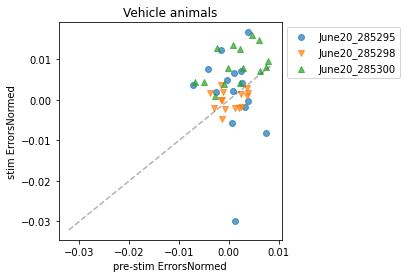

(5, 30)


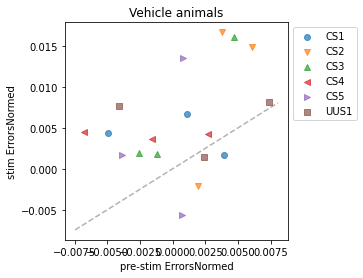

In [ ]:
#THIS CELL IS FOR RMSE ANALYSIS USING ARIMAX MODEL ORDER (0,1,1) FOR MAR7 DATA with mean error
IDlist=['June20_285295','June20_285298','June20_285300','June20_285305','June20_285306']
ALL_DATA_LIST=[ALL_DATA[ID] for ID in IDlist]
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf  #, ALL_DATA['mar7_285306'] #,'mar7_285306' #, ALL_DATA['mar7_285300']#,'mar7_285300'
all_RMSE_list=[]
all_Name_list=[]
all_AIC_list=[]
all_animalRMSE_normed_to_fitmean=[]

all_animal_Errors = []
all_animal_ErrorsNormed = []
All_animals_new_data=[]

for dsDoric, unit_ID in zip(ALL_DATA_LIST,IDlist):
  #print(dsDoric['t'].head())
  dsDoric['t_pandas'] = pd.to_timedelta(dsDoric['t'],unit='S')
  #print(dsDoric['t_pandas'].head())
  dsDoric.index = dsDoric['t_pandas']
  dsDoric = dsDoric.resample('100ms').mean()
  #print(dsDoric.info())
  print(unit_ID)
  #plot_acf(dsDoric['Green_doric_demod'])
  #plt.show()
  #plot_pacf(dsDoric['Green_doric_demod'])
  #plt.show()
  #plot_acf(dsDoric['Red_doric_demod'])
  #plt.show()
  #plot_pacf(dsDoric['Red_doric_demod'])
  #plt.show()
  dsDoric[['Green_doric_demod','Red_doric_demod','Events']].plot(color=['g','r','y'])
  dsDoric = dsDoric.dropna()
  GFP = dsDoric['Green_doric_demod'].values
  RFP = dsDoric['Red_doric_demod'].values
  t = dsDoric['t']
  Events = dsDoric['Events']
  #print(np.vstack([GFP, RFP, t, Events])[:,:5])
  PhotometryMatrix = np.vstack([GFP, RFP, t, Events])
  #print(PhotometryMatrix[:,:5])
  plt.show()
  t0_idx = np.argmax((np.diff(Events)))
  print('t0_idx:',t0_idx)
  print('t[t0_idx]:',t[t0_idx])
  t_adj = t - t[t0_idx]
  plt.plot(t_adj[1:], np.diff(Events), color='y')
  print(int(np.round(t_adj[1:][np.diff(Events)>0][2]*10)))
  print(int(np.round(t_adj[1:][np.diff(Events)>0][4]*10)))
  print(int(np.round(t_adj[1:][np.diff(Events)>0][6]*10)))
  print(int(np.round(t_adj[1:][np.diff(Events)>0][8]*10)))
  print(int(np.round(t_adj[1:][np.diff(Events)>0][10]*10)))
  print(int(np.round(t_adj[1:][np.diff(Events)>0][12]*10)))


  animalRMSE=[]
  animalRMSE_normed_to_fitmean=[]
  animals_trial_names=[]
  AIClist=[]

  Error_term_List = [] 
  Error_term_Normed_List=[] 
  New_Data_list = []   # 'DiscPTC':['start','CSUS_alpha_1','CSUS_beta_1','CSUS_gamma_1','CSUS_alpha_2','CSUS_beta_2','CSUS_gamma_2','CSUS_alpha_3','CSUS_beta_3','CSUS_gamma_3','CSUS_alpha_4','CSUS_beta_4','CSUS_gamma_4','CSUS_alpha_5','CSUS_beta_5','CSUS_gamma_5','end'],

  fig, axes6by2 = plt.subplots(15,2, constrained_layout=True, figsize=[16,48])
  for s_main, name, pltrow in zip([int(np.round(t_adj[1:][np.diff(Events)>0][i]*10)) for i in range(2,31,2)],['CSUS_alpha_1','CSUS_beta_1','CSUS_gamma_1','CSUS_alpha_2','CSUS_beta_2','CSUS_gamma_2','CSUS_alpha_3','CSUS_beta_3','CSUS_gamma_3','CSUS_alpha_4','CSUS_beta_4','CSUS_gamma_4','CSUS_alpha_5','CSUS_beta_5','CSUS_gamma_5'],range(15)):
    for s, subname, pltcol in zip([s_main-900, s_main-600],['pre-'+name, name],[0,1]):
      s=t0_idx+s
      e=s+600
      from statsmodels.tsa.arima_model import ARIMA
      Model = ARIMA(GFP[s+1:e], (0,1,1), (np.diff(RFP[s:e])))
      Results = Model.fit()
      #print(Results.summary())
      AIClist.append(Results.aic)
      forecast_30sec, stderr_30sec, conf_int_30sec = Results.forecast(steps=300, exog=np.diff(RFP[e-1:e+300]), alpha=0.05)
      #print(forecast_30sec.shape)
      axes6by2[pltrow, pltcol].plot(t_adj[s:e], GFP[s:e])
      axes6by2[pltrow, pltcol].plot(t_adj[e : e+300], forecast_30sec)
      axes6by2[pltrow, pltcol].fill_between(t_adj[e : e+300], conf_int_30sec[:,0], conf_int_30sec[:,1], color='orange', alpha=0.2)
      axes6by2[pltrow, pltcol].plot(t_adj[s:e+300], GFP[s:e+300], color='g', alpha=0.3)
      axes6by2[pltrow, pltcol].plot(t_adj[s:e+700], Events[s:e+700]*np.max(GFP[s:e+300]-0.0001), color='y', alpha=0.8)
      axes6by2[pltrow, pltcol].set_ylim(np.min([np.min(GFP[s:e+300]),np.min(conf_int_30sec[:,0])]), np.max([np.max(GFP[s:e+300]),np.max(conf_int_30sec[:,1])]))
      axes6by2[pltrow, pltcol].set_title(unit_ID+' '+subname)
      RMSE = np.sqrt(np.mean((forecast_30sec - GFP[e:e+300])**2))
      animalRMSE.append(RMSE)
      GFP_fit_mean = np.mean(GFP[s:e])
      animalRMSE_normed_to_fitmean.append(RMSE/GFP_fit_mean)

      
      animals_trial_names.append(subname)
      #axes6by2[pltrow, pltcol]

      Error_term = np.mean((GFP[e:e+300] - forecast_30sec)) #####################################
      Error_term_Normed = Error_term/GFP_fit_mean           ##################################### THIS
      Error_term_List.append(Error_term) 
      Error_term_Normed_List.append(Error_term_Normed)

      New_Data = GFP[e:e+300] - forecast_30sec
      print(New_Data.shape)
      New_Data = np.vstack([New_Data, t_adj[e : e+300],  Events[e : e+300]*np.max(New_Data-0.0001)])
      print(New_Data.shape)

      New_Data_list.append(New_Data)
  """
      forecast_90sec, stderr_90sec, conf_int_90sec = Results.forecast(steps=900, exog=np.diff(RFP[e-1:e+900]), alpha=0.05)
      #print(forecast_90sec.shape)
      axes6by2[pltrow, pltcol].plot(t_adj[s:e], GFP[s:e])
      axes6by2[pltrow, pltcol].plot(t_adj[e : e+900], forecast_90sec)
      axes6by2[pltrow, pltcol].fill_between(t_adj[e : e+900], conf_int_90sec[:,0], conf_int_90sec[:,1], color='orange', alpha=0.2)
      axes6by2[pltrow, pltcol].plot(t_adj[s:e+900], GFP[s:e+900], color='g', alpha=0.3)
      axes6by2[pltrow, pltcol].plot(t_adj[s:e+1200], Events[s:e+1200]*np.max(GFP[s:e+900]-0.0001), color='y', alpha=0.8)
      axes6by2[pltrow, pltcol].set_ylim(np.min([np.min(GFP[s:e+900]),np.min(conf_int_90sec[:,0])]), np.max([np.max(GFP[s:e+900]),np.max(conf_int_90sec[:,1])]))
      axes6by2[pltrow, pltcol].set_title(unit_ID+' '+subname)
      RMSE = np.sqrt(np.mean((forecast_90sec - GFP[e:e+900])**2))
      animalRMSE.append(RMSE)
      GFP_fit_mean = np.mean(GFP[s:e])
      animalRMSE_normed_to_fitmean.append(RMSE/GFP_fit_mean)

      
      animals_trial_names.append(subname)
      #axes6by2[pltrow, pltcol]

      Error_term = np.mean((GFP[e:e+900] - forecast_90sec)) #####################################
      Error_term_Normed = Error_term/GFP_fit_mean           ##################################### THIS
      Error_term_List.append(Error_term) 
      Error_term_Normed_List.append(Error_term_Normed)

      New_Data = GFP[e:e+900] - forecast_90sec
      print(New_Data.shape)
      New_Data = np.vstack([New_Data, t_adj[e : e+900],  Events[e : e+900]*np.max(New_Data-0.0001)])
      print(New_Data.shape)

      New_Data_list.append(New_Data)
  """
  data = [New_Data_list[2],New_Data_list[6],New_Data_list[10],New_Data_list[14],New_Data_list[18]]
  fig2, axes6by1 = plt.subplots(15,1, constrained_layout=True, figsize=[12,18])
  for i,NewData in enumerate(data):

    axes6by1[i].plot(NewData[1], NewData[0], label=unit_ID+'_'+['CSUS_alpha_1','CSUS_beta_1','CSUS_gamma_1','CSUS_alpha_2','CSUS_beta_2','CSUS_gamma_2','CSUS_alpha_3','CSUS_beta_3','CSUS_gamma_3','CSUS_alpha_4','CSUS_beta_4','CSUS_gamma_4','CSUS_alpha_5','CSUS_beta_5','CSUS_gamma_5'][i])
    axes6by1[i].plot(NewData[1],NewData[2], color='y', alpha=0.8)
    axes6by1[i].legend()
    axes6by1[i].set_xlabel('time (s)')
  plt.show()
  display(pd.DataFrame([AIClist, animalRMSE, animalRMSE_normed_to_fitmean, Error_term_List, Error_term_Normed_List], columns=animals_trial_names, index=[unit_ID+'_AIC',unit_ID+'_RMSE', unit_ID+'RMSE_normed_fitmean',unit_ID+'RMSE_Mean_Error',unit_ID+'RMSE_normed_fitmean_Mean_Error']))
  all_animal_Errors.append(Error_term_List)
  all_animal_ErrorsNormed.append(Error_term_Normed_List)

  all_RMSE_list.append(animalRMSE)
  all_Name_list.append(animals_trial_names)
  all_AIC_list.append(AIClist)
  all_animalRMSE_normed_to_fitmean.append(animalRMSE_normed_to_fitmean)
  
  plt.show()
  All_animals_new_data.append(New_Data_list)

bigDataMar7 = np.array([all_AIC_list,all_RMSE_list,all_animalRMSE_normed_to_fitmean,all_animal_Errors,all_animal_ErrorsNormed])
print(bigDataMar7.shape)
dimension_animal = bigDataMar7.shape == 3
print(dimension_animal)
print('AIC')
display(pd.DataFrame(bigDataMar7[0], index=IDlist, columns=animals_trial_names))
print('RMSE')
display(pd.DataFrame(bigDataMar7[1], index=IDlist, columns=animals_trial_names))
print('RMSE_normed')
display(pd.DataFrame(bigDataMar7[2], index=IDlist, columns=animals_trial_names))
print('MeanOfErrors')
display(pd.DataFrame(bigDataMar7[3], index=IDlist, columns=animals_trial_names))
print('MeanOfErrors_normed')
display(pd.DataFrame(bigDataMar7[4], index=IDlist, columns=animals_trial_names))
#print(all_AIC_list)
#print(all_Name_list)
#print(all_RMSE_list)
#print(all_animalRMSE_normed_to_fitmean)
#print(all_animal_Errors)
#print(all_animal_ErrorsNormed)
###############################################
mar8_tx_dict = {'Veh':['285296','285299','285303','285306'], 'Yoh':['285295','285298','285300','285305']}
June14_tx_dict = {'Veh':['285295','285298','285300','285305'], 'Yoh':['285306']}
June20_counterbalance_dict = {'CSUS_1st': ['285295','285305','285306'], 'CSUS_2nd': ['285298','285300'],
                             'TwokHz_1st':['285295','285300','285306'] ,'TwokHz_2nd':['285298','285305'] }
June21_counterbalance_dict = {'CS_1st': ['285298','285300'], 'CS_2nd': ['285295','285305','285306'],
                             'TwokHz_1st': ['285298','285305'],'TwokHz_2nd':['285295','285300','285306'] }
###############################################
tx_integers = ([0,1,2],[]) #Veh, #Yoh
filled_markers = ('o', 'v', '^', '<', '>', '8', 's', 'p', '*', 'h', 'H', 'D', 'd', 'P', 'X')

print(np.array(all_RMSE_list).shape)
thearray = np.array(all_animal_ErrorsNormed)
fig, ax = plt.subplots(1,1,figsize=[4,4])
for i in tx_integers[0]:
  ax.scatter(thearray[i][0::2],thearray[i][1::2],  label=IDlist[i], alpha=0.7, marker=filled_markers[i])

ax.set_xlabel('pre-stim ErrorsNormed')
ax.set_ylabel('stim ErrorsNormed')
ax.set_title('Vehicle animals')
ax.plot([np.min([ax.get_xlim()[0],ax.get_ylim()[0]]), np.min([ax.get_xlim()[1],ax.get_ylim()[1]])],[np.min([ax.get_xlim()[0],ax.get_ylim()[0]]), np.min([ax.get_xlim()[1],ax.get_ylim()[1]])], color='k', linestyle='--', alpha=0.3)
ax.legend(loc='upper left',bbox_to_anchor=[1, 1])
plt.show()

filled_markers = ('o', 'v', '^', '<', '>', '8', 's', 'p', '*', 'h', 'H', 'D', 'd', 'P', 'X')

print(np.array(all_RMSE_list).shape)
thearray = np.vstack([np.array(all_animal_ErrorsNormed[i]) for i in tx_integers[0]])
fig, ax = plt.subplots(1,1,figsize=[4,4])
ax.scatter(thearray[:,0],thearray[:,1],  label='CS1', alpha=0.7, marker=filled_markers[0])
ax.scatter(thearray[:,2],thearray[:,3],  label='CS2', alpha=0.7, marker=filled_markers[1])
ax.scatter(thearray[:,4],thearray[:,5],  label='CS3', alpha=0.7, marker=filled_markers[2])
ax.scatter(thearray[:,6],thearray[:,7],  label='CS4', alpha=0.7, marker=filled_markers[3])
ax.scatter(thearray[:,8],thearray[:,9],  label='CS5', alpha=0.7, marker=filled_markers[4])
ax.scatter(thearray[:,10],thearray[:,11],  label='UUS1', alpha=0.7, marker=filled_markers[6])
#ax.set_xlim(0.001, 0.004)
#ax.set_ylim(0, 0.02)
ax.set_xlabel('pre-stim ErrorsNormed')
ax.set_ylabel('stim ErrorsNormed')
ax.set_title('Vehicle animals')
ax.plot([np.min([ax.get_xlim()[0],ax.get_ylim()[0]]), np.min([ax.get_xlim()[1],ax.get_ylim()[1]])],[np.min([ax.get_xlim()[0],ax.get_ylim()[0]]), np.min([ax.get_xlim()[1],ax.get_ylim()[1]])], color='k', linestyle='--', alpha=0.3)
ax.legend(loc='upper left',bbox_to_anchor=[1, 1])
plt.show()

(5, 30, 3, 900)
3 animals with 12 traces each with NE,time,Events for 900 time points


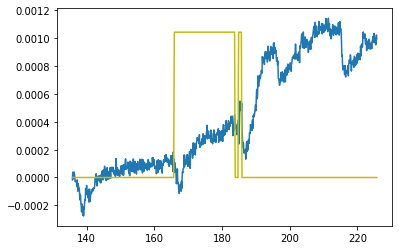

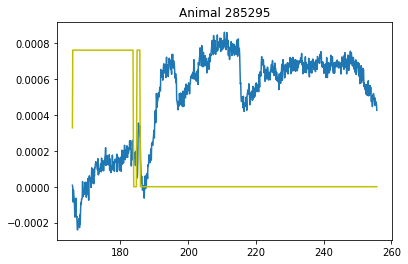

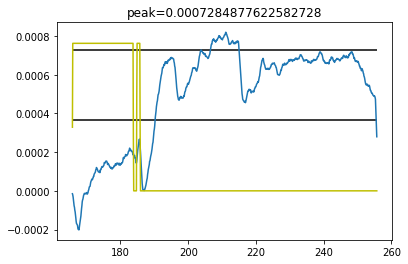

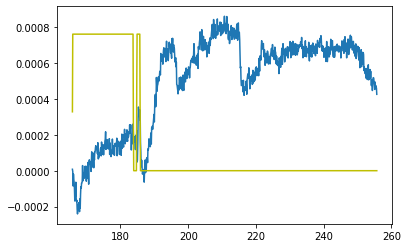

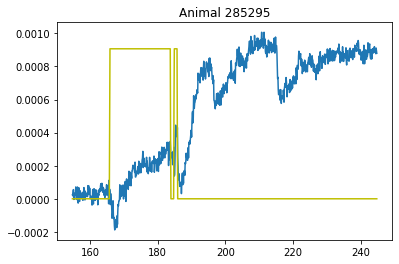

...

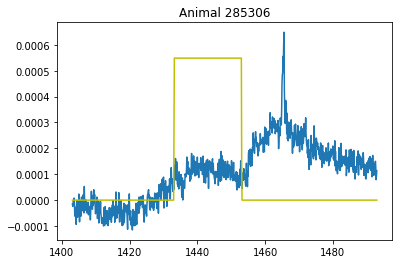

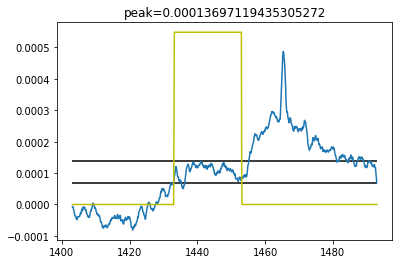

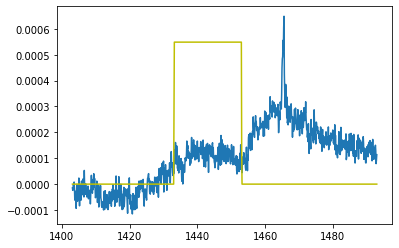

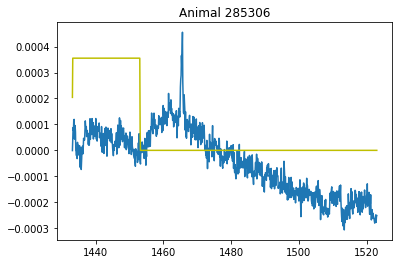

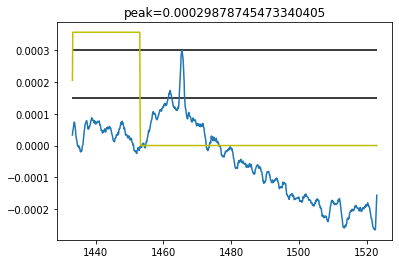

In [ ]:
data = np.array(All_animals_new_data)
print(data.shape)
print('3 animals with 12 traces each with NE,time,Events for 900 time points')
for id in range(5):
  for i in range(29):
#id=4   #set index for animal
#i=1   # set index of pre- period
    peak_permit_from_start = 400
    plt.plot(data[id][i][1][:],data[id][i][0][:])
    plt.plot(data[id][i][1][:],data[id][i][2][:], color='y')
    plt.show()
    plt.plot(data[id][i+1][1][:],data[id][i+1][0][:])
    plt.plot(data[id][i+1][1][:],data[id][i+1][2][:], color='y')
    plt.title(['Animal 285295','Animal 285298','Animal 285300','Animal 285305','Animal 285306'][id])
    plt.show()
    plt.plot(data[id][i+1][1][:],np.convolve(np.ones(10)/10 , data[id][i+1][0][:], mode='same'))
    peak = np.max(np.convolve(np.ones(10)/10 , data[id][i+1][0][:], mode='same')[:peak_permit_from_start])
    plt.plot(data[id][i+1][1][:],data[id][i+1][2][:], color='y')
    plt.hlines([peak, peak/2], data[id][i+1][1][0],data[id][i+1][1][-1])
    plt.title('peak='+str(np.max(np.convolve(np.ones(10)/10 , data[id][i+1][0][:], mode='same')[:peak_permit_from_start])))
    plt.show()